**Step # 01 Install All the Required Packages**

In [ ]:
import IPython
import sys

def clean_notebook():
    IPython.display.clear_output(wait=True)
    print("Notebook cleaned.")

# Run the installation commands
!pip install ultralytics

# Clean up the notebook
clean_notebook()



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.0/882.0 kB 13.7 MB/s eta 0:00:00


**Step # 02 Import All the Required Libraries**

In [ ]:

import ultralytics
ultralytics.checks()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


**Step # 03 Check Ultralytics Version and Setup Completion**

**Step 04: Download the Dataset from Roboflow**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="hzoVrDHDbdeFNRLoh2Nq")
project = rf.workspace("pose-detection-twxbg").project("human-activity-ce7zu")
version = project.version(2)
dataset = version.download("yolov8")

In [ ]:
!gdown "https://drive.google.com/uc?id=1kSI3LP8hVRw7dY678sH9OGmdnH7Zi-CE&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1kSI3LP8hVRw7dY678sH9OGmdnH7Zi-CE&confirm=t
To: /content/Human activity.v2i.yolov8.zip
100% 61.3M/61.3M [00:00<00:00, 112MB/s]


In [ ]:
!mkdir dataset

In [ ]:
%cd "/content/dataset/"

/content/dataset


In [ ]:
!unzip "/content/Human activity.v2i.yolov8.zip"

Archive:  /content/Human activity.v2i.yolov8.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/Screenshot-2024-09-25-at-7-20-15-PM_png.rf.882f7e6e65ab2ea72187a5edc3b6fb6b.jpg  
 extracting: test/images/Screenshot-2024-09-25-at-8-43-41-PM_png.rf.1b34e7fd2dfc832c10eb8b0968fe403e.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1d_mp4-0063_jpg.rf.4698870fb3fb543582d27ff079d6bdc9.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1d_mp4-0072_jpg.rf.6fd2fac18d418e72b3911d7e6420f1c9.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1d_mp4-0376_jpg.rf.e061f9f2cc36cc35b7ee873775301677.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1d_mp4-0377_jpg.rf.0c34807744198e1e6ee6a610c5a657cf.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1

In [ ]:
!pwd
%cd /content/

/content/dataset
/content


In [ ]:
# *** Change path in data.yaml file for Google Colab ***
# path: /content/dataset
# test: test/images    # relative to 'path'
# train: train/images  # relative to 'path'
# val: valid/images    # relative to 'path'

**Step # 05 Load the YOLO11 Model**

In [ ]:
model = YOLO("yolo11s-pose.pt")

100%|██████████| 19.4M/19.4M [00:00<00:00, 76.8MB/s]


**Step # 06 Train the YOLO11 Pose Model**

In [ ]:
results = model.train(data = "/content/dataset/data.yaml", task = "pose", mode = "train", imgsz = 640, epochs = 50, batch = 8)

Ultralytics 8.3.6 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=pose, mode=train, model=yolo11s-pose.pt, data=/content/dataset/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_box

train: Scanning /content/dataset/train/labels.cache... 1126 images, 3 backgrounds, 3 corrupt: 100%|██████████| 1126/1126 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/dataset/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0048_jpg.rf.3d6a4188d2279fd1b429fcfa0a6ce0eb.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: WARNING ⚠️ /content/dataset/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0049_jpg.rf.245067ff6f6ebf7ab9b38b346ad24ed7.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: WARNING ⚠️ /content/dataset/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0050_jpg.rf.0304242590c31d28441b27bb05c37ee5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset/valid/labels.cache... 324 images, 0 backgrounds, 0 corrupt: 100%|██████████| 324/324 [00:00<?, ?it/s]


Plotting labels to runs/pose/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/pose/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.58G      1.413      5.808     0.4169      2.858      1.369          5        640: 100%|██████████| 141/141 [00:36<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.43it/s]


                   all        324        326      0.873      0.598      0.726      0.462      0.577      0.282      0.247     0.0513

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.67G      1.442      5.499     0.3851      1.914       1.32          8        640: 100%|██████████| 141/141 [00:33<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.79it/s]

                   all        324        326      0.736      0.639      0.751       0.42      0.312      0.209      0.182     0.0322



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.66G      1.469      5.486     0.3868      1.623      1.341         10        640: 100%|██████████| 141/141 [00:32<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.07it/s]


                   all        324        326      0.633      0.695       0.74      0.428       0.42      0.441      0.366     0.0934

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.65G      1.394      5.176     0.3683      1.422      1.313          4        640: 100%|██████████| 141/141 [00:31<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:05<00:00,  4.19it/s]


                   all        324        326      0.661       0.82      0.812      0.502       0.56      0.492      0.471      0.155

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.65G      1.412      5.067     0.3724      1.373      1.307          5        640: 100%|██████████| 141/141 [00:30<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:05<00:00,  4.05it/s]

                   all        324        326      0.699      0.764       0.79      0.485      0.477      0.427       0.38     0.0898



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.65G       1.34      4.747     0.3538      1.276      1.262          6        640: 100%|██████████| 141/141 [00:31<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.55it/s]

                   all        324        326      0.812      0.734      0.833      0.568      0.603      0.559      0.531      0.169



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.64G      1.301      4.552     0.3373       1.17      1.263          4        640: 100%|██████████| 141/141 [00:31<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.33it/s]

                   all        324        326      0.867      0.774      0.887      0.614      0.723       0.63      0.649      0.225



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.63G      1.228      4.301     0.3334       1.09      1.212          4        640: 100%|██████████| 141/141 [00:32<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.78it/s]

                   all        324        326      0.811       0.78      0.845      0.554       0.67      0.631      0.586      0.215



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.64G      1.266      4.224     0.3261      1.105      1.245          6        640: 100%|██████████| 141/141 [00:33<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.88it/s]

                   all        324        326      0.825      0.869       0.91      0.628      0.666      0.706      0.694      0.259



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.64G      1.224      4.164     0.3166      1.065      1.214          6        640: 100%|██████████| 141/141 [00:32<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.89it/s]

                   all        324        326      0.891       0.81      0.909      0.636      0.765      0.687      0.688      0.278



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.64G      1.173      4.043     0.3111      1.027      1.178          2        640: 100%|██████████| 141/141 [00:31<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.87it/s]

                   all        324        326      0.846      0.878      0.899      0.616      0.728       0.76      0.702      0.294



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.64G      1.201      4.033     0.3113      1.018      1.204          5        640: 100%|██████████| 141/141 [00:32<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.82it/s]

                   all        324        326      0.838      0.802      0.904       0.61      0.731      0.719      0.763      0.303



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.65G      1.157      3.775     0.2975     0.9862       1.18          6        640: 100%|██████████| 141/141 [00:32<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.80it/s]

                   all        324        326      0.831      0.896      0.929      0.643      0.732      0.778      0.761      0.321



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.63G      1.119      3.676     0.2986     0.9403      1.165          7        640: 100%|██████████| 141/141 [00:31<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.60it/s]

                   all        324        326      0.862      0.849      0.918      0.657      0.736      0.716      0.737      0.315



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.63G      1.139      3.759     0.2918     0.9249      1.177          5        640: 100%|██████████| 141/141 [00:31<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.16it/s]

                   all        324        326      0.835      0.911       0.91      0.646      0.706      0.776      0.742      0.351



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.62G      1.115      3.573     0.2923     0.9031      1.163          3        640: 100%|██████████| 141/141 [00:31<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.44it/s]


                   all        324        326      0.873      0.895      0.913      0.627      0.767      0.806      0.756      0.361

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.64G      1.078      3.477     0.2857     0.8973      1.144          5        640: 100%|██████████| 141/141 [00:31<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.30it/s]

                   all        324        326       0.83       0.93       0.93      0.652      0.744      0.832        0.8      0.351



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.64G      1.132      3.677     0.2825     0.9341      1.161          6        640: 100%|██████████| 141/141 [00:30<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:05<00:00,  3.98it/s]


                   all        324        326      0.856      0.892      0.918      0.663      0.793      0.827      0.822       0.39

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.64G      1.115      3.453     0.2809     0.9071      1.168          5        640: 100%|██████████| 141/141 [00:30<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:05<00:00,  3.98it/s]

                   all        324        326      0.891      0.889      0.939      0.678      0.829      0.833       0.86      0.423



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.63G      1.053      3.265     0.2628     0.8547      1.134          3        640: 100%|██████████| 141/141 [00:30<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.51it/s]

                   all        324        326       0.86      0.908      0.929      0.686      0.791      0.832      0.828      0.423



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.64G      1.102      3.342     0.2684     0.8771      1.145          6        640: 100%|██████████| 141/141 [00:30<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.45it/s]

                   all        324        326      0.849      0.914      0.935      0.657      0.777      0.832      0.832       0.42



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.64G       1.02      3.097     0.2562     0.8283      1.109          7        640: 100%|██████████| 141/141 [00:32<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.76it/s]

                   all        324        326      0.832      0.938      0.931      0.681      0.758       0.86      0.842      0.417



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.64G     0.9965      3.181     0.2698     0.7887      1.104          6        640: 100%|██████████| 141/141 [00:32<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.99it/s]

                   all        324        326      0.911      0.881      0.948       0.72      0.831      0.781      0.832      0.409



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.63G     0.9962      3.156     0.2672     0.7831      1.118          4        640: 100%|██████████| 141/141 [00:31<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.89it/s]

                   all        324        326      0.893      0.925      0.949      0.712      0.809      0.842      0.841      0.458



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.64G       0.99      3.032     0.2574     0.7665      1.111          3        640: 100%|██████████| 141/141 [00:32<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.90it/s]

                   all        324        326      0.897      0.906      0.953      0.701      0.852      0.843      0.876      0.472



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.64G      0.968      2.947     0.2535     0.7446        1.1          5        640: 100%|██████████| 141/141 [00:32<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.94it/s]

                   all        324        326       0.91      0.911      0.955      0.716      0.845      0.845      0.868      0.475



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.64G       0.98      2.822     0.2435     0.7494      1.094          4        640: 100%|██████████| 141/141 [00:32<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.50it/s]

                   all        324        326      0.916      0.919      0.956      0.705       0.85       0.85      0.868      0.469



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.63G     0.9713      2.878     0.2562     0.7563      1.101          4        640: 100%|██████████| 141/141 [00:31<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.02it/s]

                   all        324        326      0.917      0.888       0.95      0.721      0.901      0.825      0.888      0.474



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.64G     0.9582      2.821     0.2514      0.722      1.089          6        640: 100%|██████████| 141/141 [00:31<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.00it/s]

                   all        324        326      0.908      0.895      0.952      0.717      0.861      0.849      0.871       0.47



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.64G     0.9273      2.776     0.2491     0.7172      1.079          5        640: 100%|██████████| 141/141 [00:31<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.57it/s]

                   all        324        326       0.91      0.932      0.956      0.733      0.867      0.882      0.894      0.515



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.64G     0.9059      2.704     0.2416     0.7041      1.067          4        640: 100%|██████████| 141/141 [00:30<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:05<00:00,  3.88it/s]

                   all        324        326      0.913       0.91      0.958      0.715      0.865      0.868      0.892      0.508



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.62G     0.9089      2.718     0.2436     0.6933      1.074          3        640: 100%|██████████| 141/141 [00:30<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.62it/s]

                   all        324        326      0.905      0.915      0.955      0.723      0.844      0.856      0.864        0.5



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.64G     0.8862      2.699     0.2465     0.6928       1.07          4        640: 100%|██████████| 141/141 [00:32<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.44it/s]

                   all        324        326      0.883       0.88      0.946      0.729      0.842      0.843      0.881      0.524



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.64G     0.9132      2.653     0.2345     0.6824      1.073         10        640: 100%|██████████| 141/141 [00:32<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.91it/s]

                   all        324        326      0.874      0.935      0.948      0.737      0.831      0.885       0.88      0.536



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.64G     0.8738      2.562     0.2409      0.661      1.058          6        640: 100%|██████████| 141/141 [00:31<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.92it/s]

                   all        324        326      0.912      0.898      0.956      0.741      0.867      0.851      0.889      0.559



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.63G     0.8824      2.516     0.2394     0.6418      1.065          4        640: 100%|██████████| 141/141 [00:33<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.88it/s]

                   all        324        326      0.911      0.937      0.961      0.761      0.867      0.892      0.907      0.586



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.64G     0.8603      2.419     0.2248      0.662      1.059          4        640: 100%|██████████| 141/141 [00:33<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.84it/s]

                   all        324        326      0.934      0.906      0.953      0.767      0.894      0.865      0.906      0.551



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.64G     0.8538      2.477     0.2353     0.6618       1.05          5        640: 100%|██████████| 141/141 [00:33<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.90it/s]

                   all        324        326      0.953      0.924      0.965      0.759      0.905      0.878      0.906      0.541



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.63G     0.8376      2.437     0.2264     0.6256      1.045          4        640: 100%|██████████| 141/141 [00:32<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.91it/s]

                   all        324        326      0.905      0.875      0.963      0.761      0.874      0.844      0.923      0.588



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.62G     0.8446      2.367     0.2289     0.6434      1.047          4        640: 100%|██████████| 141/141 [00:33<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.90it/s]

                   all        324        326      0.916       0.92       0.96      0.762      0.882      0.886      0.919      0.578


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.64G     0.7636      1.787     0.1979     0.5149      1.024          3        640: 100%|██████████| 141/141 [00:33<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.65it/s]


                   all        324        326      0.937      0.936       0.96      0.764      0.903      0.902      0.917      0.569

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.64G     0.7315      1.717     0.1887     0.5022      1.013          3        640: 100%|██████████| 141/141 [00:30<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.88it/s]

                   all        324        326      0.919      0.916      0.962      0.776      0.898      0.868      0.912      0.596



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.64G     0.7215      1.656     0.1885     0.4807     0.9985          3        640: 100%|██████████| 141/141 [00:30<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.22it/s]

                   all        324        326      0.913      0.951      0.963      0.774      0.872      0.909      0.916      0.611



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.63G     0.7061      1.573     0.1781     0.4783          1          3        640: 100%|██████████| 141/141 [00:29<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:05<00:00,  3.66it/s]

                   all        324        326      0.911      0.932      0.965      0.777      0.877      0.898      0.925      0.618



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.64G     0.6912      1.562     0.1798     0.4719     0.9911          3        640: 100%|██████████| 141/141 [00:30<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:05<00:00,  4.05it/s]

                   all        324        326      0.919      0.944      0.964      0.787      0.921      0.885      0.924      0.625



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.63G     0.6749      1.517     0.1754     0.4537     0.9748          3        640: 100%|██████████| 141/141 [00:30<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:05<00:00,  4.00it/s]

                   all        324        326      0.902      0.954      0.965      0.787      0.877      0.928      0.936      0.632



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.64G     0.6618      1.428     0.1645     0.4452     0.9695          3        640: 100%|██████████| 141/141 [00:29<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.40it/s]

                   all        324        326      0.932      0.939      0.965      0.785      0.906      0.913      0.937      0.631



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.63G     0.6612       1.45     0.1712     0.4445     0.9711          3        640: 100%|██████████| 141/141 [00:29<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.44it/s]

                   all        324        326      0.932       0.94      0.967       0.79      0.903      0.909      0.934      0.644



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.64G     0.6365      1.379     0.1661     0.4359     0.9646          3        640: 100%|██████████| 141/141 [00:31<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.64it/s]

                   all        324        326      0.946       0.93      0.967      0.794      0.928      0.907      0.943      0.647



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.64G     0.6294       1.37     0.1705     0.4286     0.9656          3        640: 100%|██████████| 141/141 [00:31<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.18it/s]

                   all        324        326      0.937      0.934      0.966      0.797      0.926      0.902      0.941      0.649



50 epochs completed in 0.517 hours.
Optimizer stripped from runs/pose/train2/weights/last.pt, 20.2MB
Optimizer stripped from runs/pose/train2/weights/best.pt, 20.2MB

Validating runs/pose/train2/weights/best.pt...
Ultralytics 8.3.6 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11s-pose summary (fused): 257 layers, 9,904,101 parameters, 0 gradients, 23.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:06<00:00,  3.30it/s]


                   all        324        326      0.937      0.935      0.966      0.798      0.926      0.902      0.941      0.649
             Fall-Down         91         91      0.989      0.965      0.988      0.886      0.949      0.923      0.938      0.732
               Sitting        104        104      0.972      0.994      0.993      0.915      0.953      0.972      0.985      0.746
              Standing         84         84      0.915      0.898      0.956      0.688      0.947      0.905       0.97      0.632
               Walking         47         47      0.873      0.881      0.927      0.702      0.856      0.809       0.87      0.485
Speed: 0.3ms preprocess, 6.3ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/pose/train2


**Step # 07 Validate Custom Model**

In [ ]:
#Validate the Model
metrics = model.val()

Ultralytics 8.3.6 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11s-pose summary (fused): 257 layers, 9,904,101 parameters, 0 gradients, 23.1 GFLOPs


val: Scanning /content/dataset/valid/labels.cache... 324 images, 0 backgrounds, 0 corrupt: 100%|██████████| 324/324 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 41/41 [00:08<00:00,  4.80it/s]


                   all        324        326      0.937      0.934      0.966      0.799      0.926      0.902      0.941      0.649
             Fall-Down         91         91      0.989      0.965      0.988      0.885      0.949      0.923      0.938      0.732
               Sitting        104        104      0.972      0.994      0.993      0.916      0.953      0.972      0.985      0.747
              Standing         84         84      0.915      0.898      0.956      0.688      0.947      0.905       0.97      0.632
               Walking         47         47      0.873      0.879      0.928      0.707      0.856      0.809      0.871      0.485
Speed: 0.5ms preprocess, 11.4ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/pose/train22


In [ ]:
metrics.box.map

0.79897941328776

In [ ]:
metrics.box.map50

0.9663340184548673

In [ ]:
metrics.box.map75

0.886379284791089

In [ ]:
metrics.box.maps

array([    0.88497,     0.91605,     0.68769,     0.70721])

**Step # 08 Results Analysis**

**Confusion Matrix**

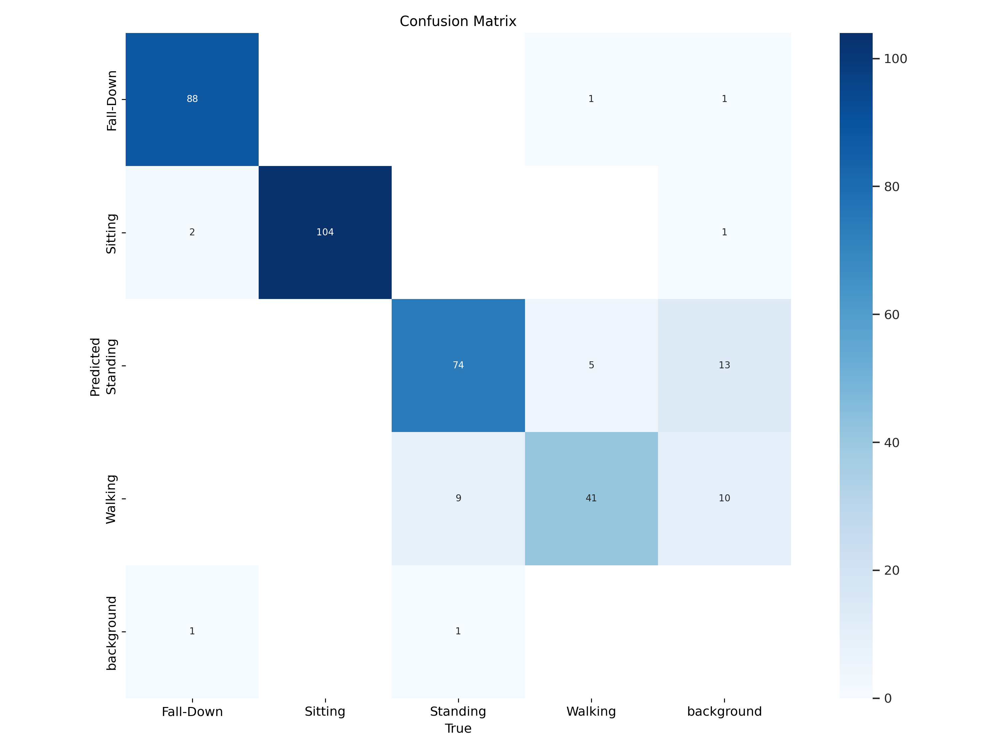

In [ ]:
from IPython.display import Image, display
Image("/content/runs/pose/train2/confusion_matrix.png", width = 800)

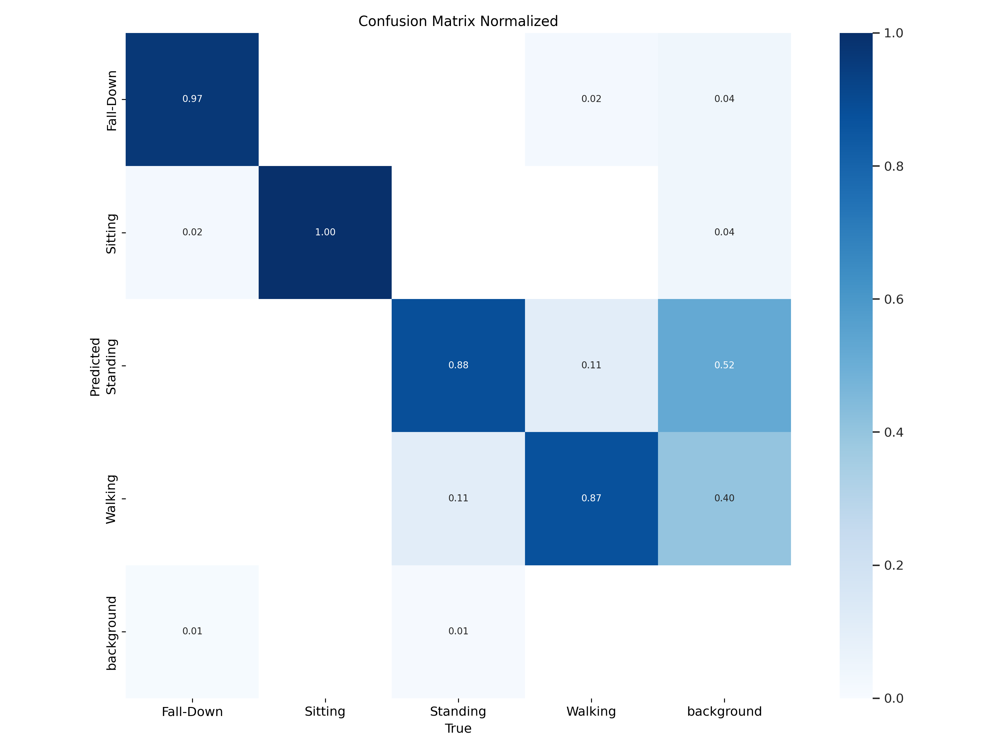

In [ ]:
from IPython.display import Image, display
Image("/content/runs/pose/train2/confusion_matrix_normalized.png", width = 800)

**Percision Curve**

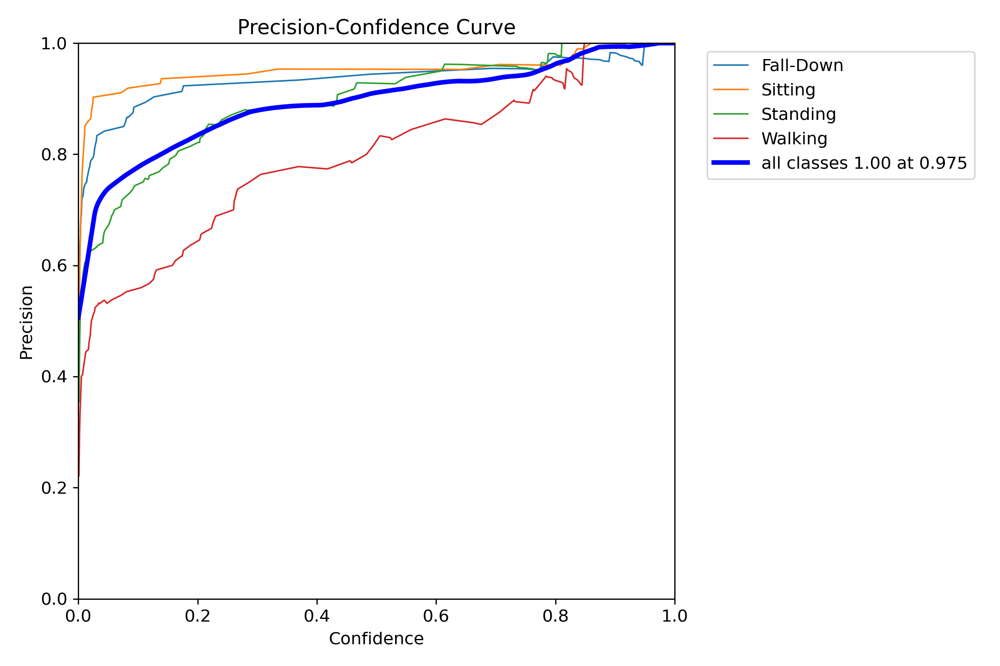

In [ ]:
Image("/content/runs/pose/train2/PoseP_curve.png", width = 800)

**Recall Curve**

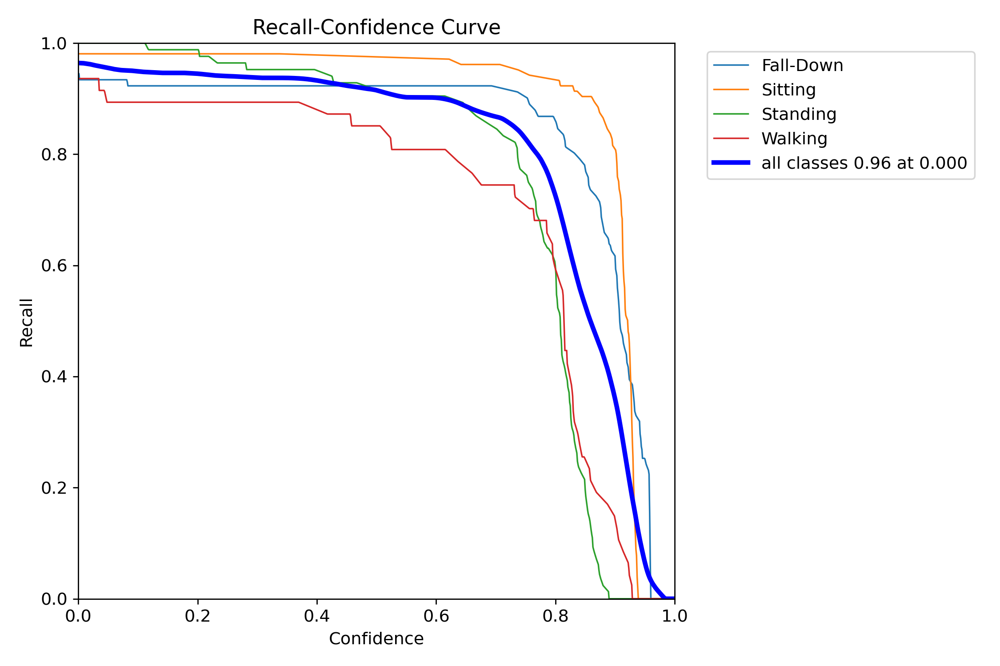

In [ ]:
Image("/content/runs/pose/train2/PoseR_curve.png", width = 800)

**Model Predictions on Validation Batch**

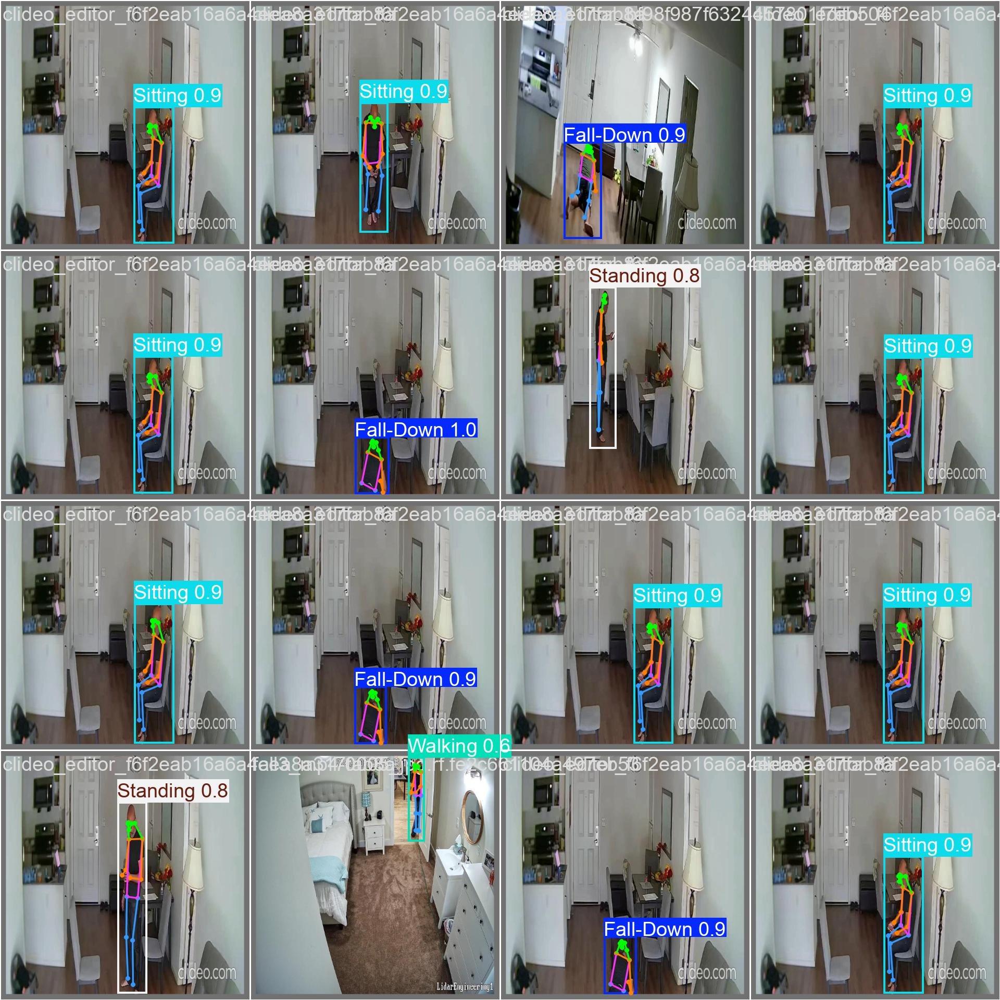

In [ ]:
Image("/content/runs/pose/train2/val_batch1_pred.jpg", width = 800)

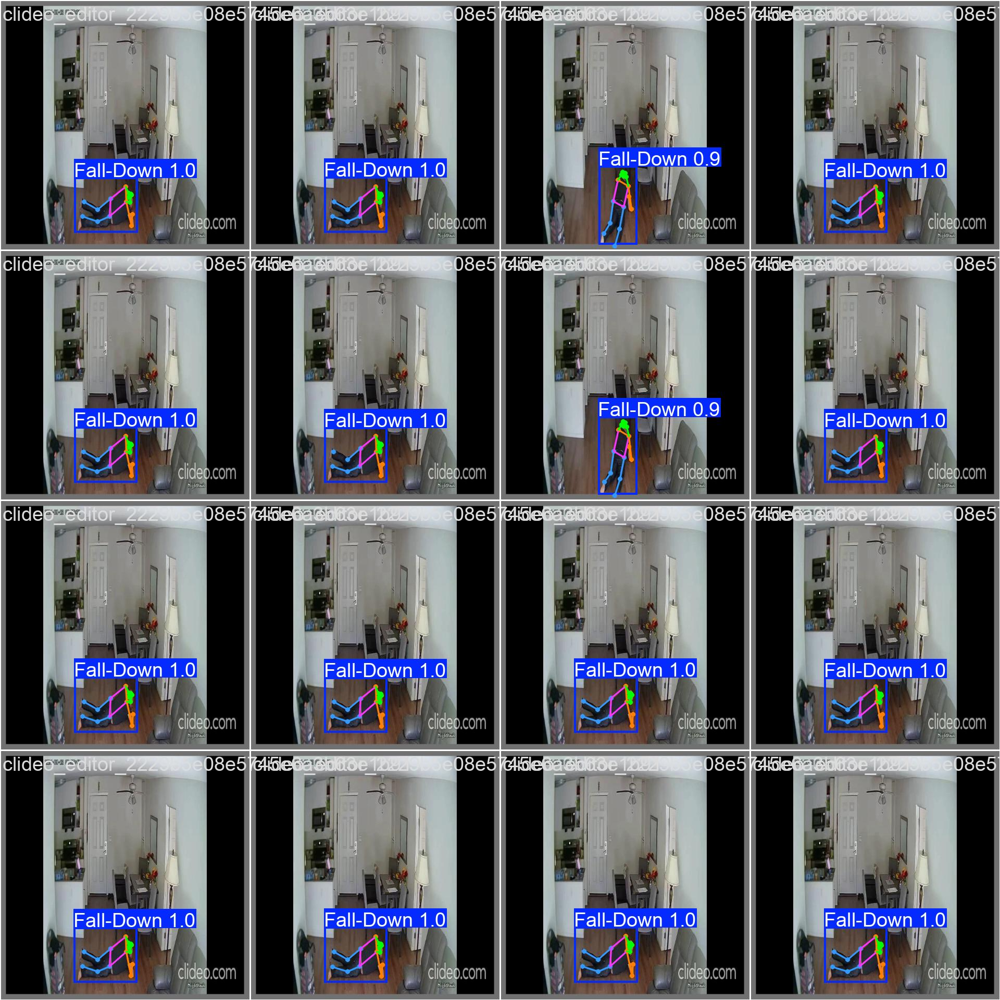

In [ ]:
Image("/content/runs/pose/train2/val_batch2_pred.jpg", width = 800)

**Step # 09 Inference on Test Dataset Images using the Trained/ Fine-Tune Pose Estimation Model**

In [ ]:
!gdown "https://drive.google.com/uc?id=1H3cfzzH9v3T9k9TNj8oaUy_sf-PH1kTA&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1H3cfzzH9v3T9k9TNj8oaUy_sf-PH1kTA&confirm=t
To: /content/best.pt
100% 20.2M/20.2M [00:00<00:00, 23.8MB/s]


In [ ]:
#Load Trained Model
model = YOLO("/content/best.pt")
#Specify the test folder path
test_path = "/content/dataset/test/images"
#List all the images in the test folder
import os
image_files = [os.path.join(test_path, img) for img in os.listdir(test_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

#Predict each images
for img_path in image_files:
  results = model.predict(source = img_path, save = True, conf = 0.25)


image 1/1 /content/dataset/test/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0108_jpg.rf.6c48e5f449b2a1ed9a67d1e6858baa05.jpg: 640x640 1 Standing, 17.1ms
Speed: 5.4ms preprocess, 17.1ms inference, 741.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/dataset/test/images/clideo_editor_454ae88c0d8f4113a208876eb58e9b67_mp4-0298_jpg.rf.817dac574ca0b79ec53e590e31f483c8.jpg: 640x640 1 Sitting, 17.0ms
Speed: 2.1ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/dataset/test/images/clideo_editor_bf98f987f6324457801f7eb504ed9705_mp4-0004_jpg.rf.842bc3ed6289620b2a27a430fd118617.jpg: 640x640 1 Sitting, 17.1ms
Speed: 2.2ms preprocess, 17.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/dataset/test/images/clideo_editor_454ae88c0d8f4113a208876eb58e9b67_mp4-0262_jpg.

**Step # 10 Plot Prediction on Test Images**

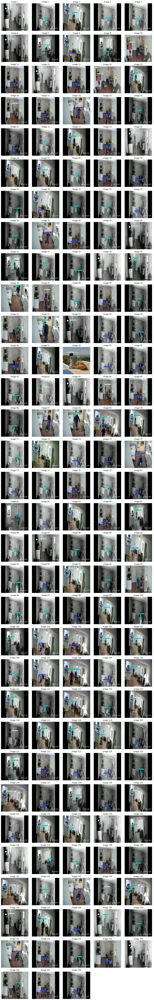

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Plot prediction on test images

# Specify the predict folder path
pred_path = '/content/runs/pose/predict'

# List all images in the predict folder
pred_image_files = [os.path.join(pred_path, img) for img in os.listdir(pred_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Number of images per row
images_per_row = 5

# Calculate the number of rows needed
n_rows = len(pred_image_files) // images_per_row + int(len(pred_image_files) % images_per_row != 0)

# Set figure size
fig, axs = plt.subplots(n_rows, images_per_row, figsize=(15, 3 * n_rows))

# Flatten axes if necessary (for easier iteration)
axs = axs.flatten()

# Loop through each image and display it
for i, img_path in enumerate(pred_image_files):
    img = mpimg.imread(img_path)      # Read the image
    axs[i].imshow(img)                # Show the image
    axs[i].axis('off')                # Turn off axis
    axs[i].set_title(f"Image {i+1}")  # Add title

# Hide any extra empty subplots (if the number of images is not a perfect multiple of images_per_row)
for j in range(i+1, len(axs)):
    axs[j].axis('off')  # Hide unused axes

# Display all images
plt.tight_layout()
plt.show()


**Step # 10 Inference on Video**

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!gdown "https://drive.google.com/uc?id=19jREqMUWoJgixJgwgeHvvsPu82neJITp&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=19jREqMUWoJgixJgwgeHvvsPu82neJITp&confirm=t
To: /content/video1.mp4
100% 1.40M/1.40M [00:00<00:00, 11.6MB/s]


In [ ]:
results = model.predict(source = "/content/video1.mp4", save = True, conf = 0.25, iou = 0.2)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/272) /content/video1.mp4: 384x640 (no detections), 37.0ms
video 1/1 (frame 2/272) /content/video1.mp4: 384x640 (no detections), 35.0ms
video 1/1 (frame 3/272) /content/video1.mp4: 384x640 (no detections), 23.9ms
video 1/1 (frame 4/272) /content/video1.mp4: 384x640 (no detections), 14.8ms
video 1/1 (frame 5/272) /content/video1.mp4: 384x640 (no detections), 35.5ms
video 1/1 (frame 6/272) /content/video1.mp4: 384x640 (no detections), 1

In [ ]:
!rm "/content/result_compressed.mp4"

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/pose/predict/video1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)